# Neural Style Transfer

NST uses pretrained CNNs and 2 input images - content image and style image - to produce the output image.
A specially crafted loss function makes sure that:
1. The content of the output image is close to the content image by optimising MSE loss between embedding layers of the content and output images.
2. Style of the output image is close to the style of the style image by optimizing MSE loss between Gramm matrices of all feature layers of style and output images.

$$
\mathcal{L}^{NST}=\alpha*\mathcal{L}^{S}+\beta*\mathcal{L}^{C}
$$

$$
\mathcal{L}^{S}=\sum_{l} {MSE(G_g^l,G_s^l)}
$$

Where $G_g^l$ is the Gram matrix of $l$-th feature layer of the generated image, $G_s$ is the Gram matrix of $l$-th feature layer of the style image.
$$
G^l_{i,j}=\sum{F^l_i \odot F^l_j}
$$
Where $F^l_i, F^l_j$ are i-th and j-th channels of the $l$-th feature layer of the CNN. Gram matrix captures correlations between all pairs of same layer features across the image. Seems like a pretty arbitrary choice to capture style information but works well in practice.

$$
\mathcal{L}^C=MSE(EMB_{CNN}(c), EMB_{CNN}(g)))
$$

Where $EMB_{CNN}(i)$ is the embedding layer of the CNN network calculated for an image $i$

## Links

* [A Neural Algorithm of Artistic Style (2015)](https://arxiv.org/pdf/1508.06576.pdf)

In [1]:
from matplotlib import pyplot as plt
import torch
import torchvision as tv
from torchvision.models import VGG19_Weights
from torchvision.models.feature_extraction import get_graph_node_names
from tqdm.notebook import tqdm
from torchvision.models.feature_extraction import create_feature_extractor
import glob
import matplotlib as mpl
from torchvision.models._utils import _ovewrite_named_param
from torchvision.models import VGG
from torchvision.models._api import WeightsEnum
from torch import nn
from typing import List, Union, cast, Dict, Optional, Any

EPOCHS = 3000

mpl.rcParams['figure.figsize'] = [10., 5.]

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
DEVICE

'cuda'

In [2]:
CONTENT_FILES = ['content1.jpg',
                 'content3.jpg',
                 'content6.jpg']

In [3]:
STYLE_FILES = ['style1.jpg', 'style3.jpg', 'style5.jpg']

## Model

We use VGG19 model with pretrained weights from ImageNet. The only difference from pytorch implementation is the use of average pooling instead of max pooling. According to the original NST paper average pooling produces more pleasing results.

In [4]:
def make_layers(cfg: List[Union[str, int]], batch_norm: bool = False) -> nn.Sequential:
    layers: List[nn.Module] = []
    in_channels = 3
    for v in cfg:
        if v == "M":
            layers += [nn.AvgPool2d(kernel_size=2, stride=2)]
        else:
            v = cast(int, v)
            conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = v
    return nn.Sequential(*layers)


cfgs: Dict[str, List[Union[str, int]]] = {
    "A": [64, "M", 128, "M", 256, 256, "M", 512, 512, "M", 512, 512, "M"],
    "B": [64, 64, "M", 128, 128, "M", 256, 256, "M", 512, 512, "M", 512, 512, "M"],
    "D": [64, 64, "M", 128, 128, "M", 256, 256, 256, "M", 512, 512, 512, "M", 512, 512, 512, "M"],
    "E": [64, 64, "M", 128, 128, "M", 256, 256, 256, 256, "M", 512, 512, 512, 512, "M", 512, 512, 512, 512, "M"],
}


def _vgg(cfg: str, batch_norm: bool, weights: Optional[WeightsEnum], progress: bool, **kwargs: Any) -> VGG:
    if weights is not None:
        kwargs["init_weights"] = False
        if weights.meta["categories"] is not None:
            _ovewrite_named_param(kwargs, "num_classes", len(weights.meta["categories"]))
    model = VGG(make_layers(cfgs[cfg], batch_norm=batch_norm), **kwargs)
    if weights is not None:
        model.load_state_dict(weights.get_state_dict(progress=progress))
    return model

In [5]:
WEIGHTS = VGG19_Weights.verify(VGG19_Weights.DEFAULT)
model = _vgg("E", False, WEIGHTS, True).to(DEVICE).eval()
for p in model.parameters():
    p.requires_grad = False
train_nodes, eval_nodes = get_graph_node_names(model)
eval_nodes

['x',
 'features.0',
 'features.1',
 'features.2',
 'features.3',
 'features.4',
 'features.5',
 'features.6',
 'features.7',
 'features.8',
 'features.9',
 'features.10',
 'features.11',
 'features.12',
 'features.13',
 'features.14',
 'features.15',
 'features.16',
 'features.17',
 'features.18',
 'features.19',
 'features.20',
 'features.21',
 'features.22',
 'features.23',
 'features.24',
 'features.25',
 'features.26',
 'features.27',
 'features.28',
 'features.29',
 'features.30',
 'features.31',
 'features.32',
 'features.33',
 'features.34',
 'features.35',
 'features.36',
 'avgpool',
 'flatten',
 'classifier.0',
 'classifier.1',
 'classifier.2',
 'classifier.3',
 'classifier.4',
 'classifier.5',
 'classifier.6']

In [6]:
STYLE_LAYERS = ['features.1', 'features.6', 'features.11', 'features.20', 'features.29']
CONTENT_LAYERS = ['features.22']

TRANSFORMS = WEIGHTS.transforms()

In [7]:
STYLE_LAYERS

['features.1', 'features.6', 'features.11', 'features.20', 'features.29']

In [8]:
CONTENT_LAYERS

['features.22']

In [9]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (17): ReLU(inplace=True)
    (18): AvgPool

In [10]:
def decode_image(img):
    img = img.detach().cpu()
    invTrans = tv.transforms.Compose([tv.transforms.Normalize(mean=[0., 0., 0.],
                                                              std=[1 / 0.229, 1 / 0.224, 1 / 0.225]),
                                      tv.transforms.Normalize(mean=[-0.485, -0.456, -0.406],
                                                              std=[1., 1., 1.]),
                                      ])
    return torch.clip(invTrans(img).permute((0, 2, 3, 1))[0], 0., 1.)

In [11]:
def load_image(fname):
    img = tv.io.read_image(fname)
    return TRANSFORMS(img.unsqueeze(0)).to(DEVICE)

In [12]:
def gram_matrix(t):
    plane_size = t.shape[-1] * t.shape[-2]
    return torch.einsum('dixy,djxy->dij', t, t) / (plane_size)


# Content reconstruction

In [13]:
def reconstruct_content(model, fname, epochs=1000, verbose=True):
    cimg = load_image(fname)
    content_feature_extractor = create_feature_extractor(model, train_return_nodes=[], eval_return_nodes=CONTENT_LAYERS)
    content_features = content_feature_extractor(cimg)
    pimg = torch.nn.Parameter(torch.rand_like(cimg).to(DEVICE))

    loss = torch.nn.MSELoss(reduction='mean')
    optim = torch.optim.Adam([pimg], lr=0.01)

    progress = tqdm(range(epochs), miniters=100, disable=not verbose)
    for _ in progress:
        generated_features = content_feature_extractor(pimg)
        loss_style = torch.mean(torch.stack([loss(content_features[f], generated_features[f]) for f in CONTENT_LAYERS]))
        optim.zero_grad()
        loss_style.backward()
        optim.step()
        progress.set_description(desc=f'{loss_style.item():.02f}')
    return pimg



  0%|          | 0/3 [00:00<?, ?it/s]

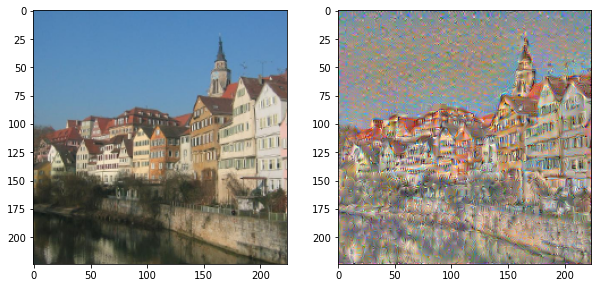

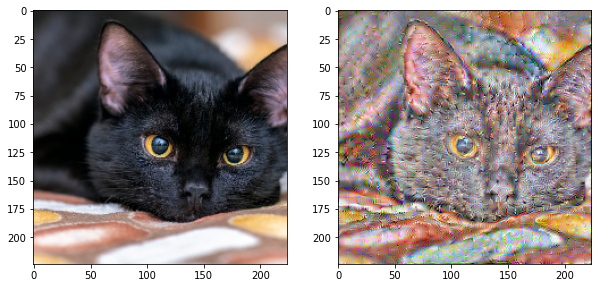

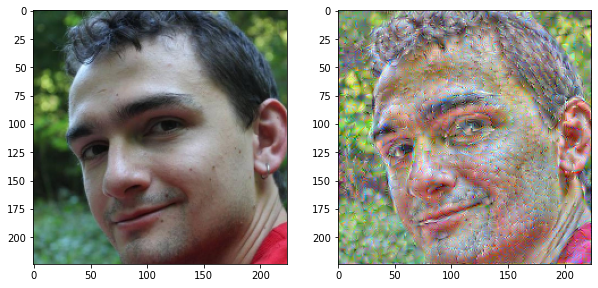

In [14]:
for fname in tqdm(CONTENT_FILES):
    cimg = load_image(fname)
    gimg = reconstruct_content(model, fname, EPOCHS, verbose=False)
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(decode_image(cimg))
    axs[1].imshow(decode_image(gimg))

## Style reconstruction

In [15]:
def style_reconstruction(model, fname, epochs=1000, verbose=True):
    simg = load_image(fname)
    style_feature_extractor = create_feature_extractor(model, train_return_nodes=[], eval_return_nodes=STYLE_LAYERS)

    style_features = {f: gram_matrix(t) for f, t in style_feature_extractor(simg).items()}
    pimg = torch.nn.Parameter(torch.rand_like(simg))

    optim = torch.optim.Adam([pimg], lr=0.01)
    loss = torch.nn.MSELoss()
    progress = tqdm(range(epochs), disable=not verbose)
    for epoch in progress:
        generated_features = style_feature_extractor(pimg)
        generated_gram_matrices = {f: gram_matrix(t) for f, t in generated_features.items()}
        loss_style = torch.mean(torch.stack([loss(generated_gram_matrices[f], s) for f, s in style_features.items()]))
        optim.zero_grad()
        loss_style.backward()
        optim.step()
        progress.set_description(f'loss:{loss_style.item():.05f}')
    return pimg

  0%|          | 0/3 [00:00<?, ?it/s]

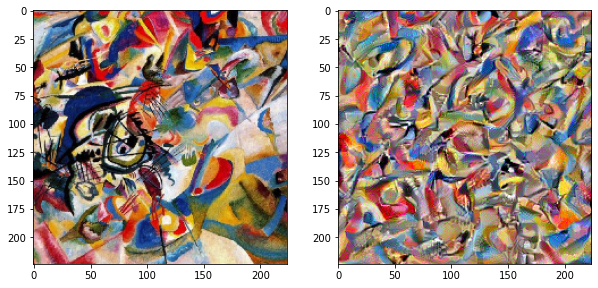

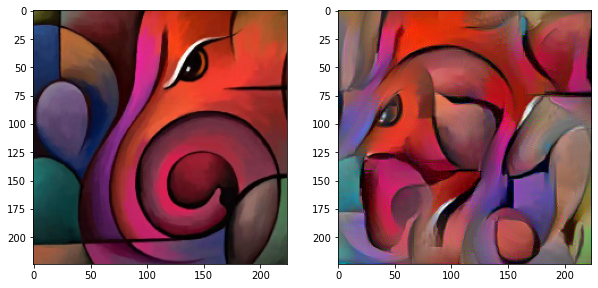

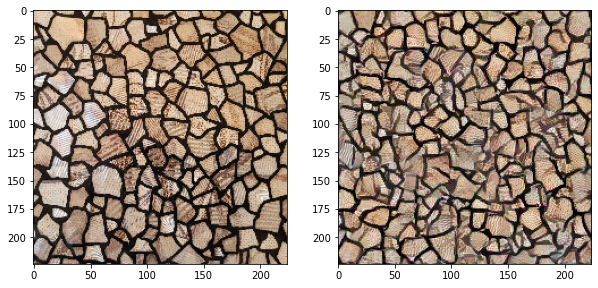

In [16]:
for fname in tqdm(STYLE_FILES):
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(decode_image(load_image(fname)))
    axs[1].imshow(decode_image(style_reconstruction(model, fname, EPOCHS, verbose=False)))

## Content + style reconstruction

In [17]:
def neural_style_transfer(model, style_fname, content_fname, epochs=1000, style_alpha=100, verbose=True):
    simg = load_image(style_fname)
    cimg = load_image(content_fname)

    style_features = create_feature_extractor(model, train_return_nodes=[], eval_return_nodes=STYLE_LAYERS)(simg)
    style_features = {f: gram_matrix(style_features[f]) for f in STYLE_LAYERS}

    content_features = create_feature_extractor(model, train_return_nodes=[], eval_return_nodes=CONTENT_LAYERS)(cimg)
    content_features = {f: content_features[f] for f in CONTENT_LAYERS}

    pimg = torch.nn.Parameter(torch.rand_like(cimg))

    optim = torch.optim.Adam([pimg], lr=0.01)
    mse_loss = torch.nn.MSELoss(reduction='mean')
    progress = tqdm(range(epochs), miniters=100, disable=not verbose)

    content_style_feature_extractor = create_feature_extractor(model, train_return_nodes=[],
                                                               eval_return_nodes=STYLE_LAYERS + CONTENT_LAYERS)

    for epoch in progress:
        generated_features = content_style_feature_extractor(pimg)

        generated_gram_matrices = {f: gram_matrix(generated_features[f]) for f in STYLE_LAYERS}

        loss_style = style_alpha * torch.mean(
            torch.stack([mse_loss(generated_gram_matrices[f], s) for f, s in style_features.items()]))

        loss_content = torch.mean(
            torch.stack([mse_loss(content_features[f], generated_features[f]) for f in CONTENT_LAYERS]))

        loss = loss_content + loss_style

        optim.zero_grad()
        loss.backward()
        optim.step()

        progress.set_description(f'content_loss:{loss_content.item():.03f}; style_loss:{loss_style.item():.03f};')
    return pimg

Images:   0%|          | 0/3 [00:00<?, ?it/s]

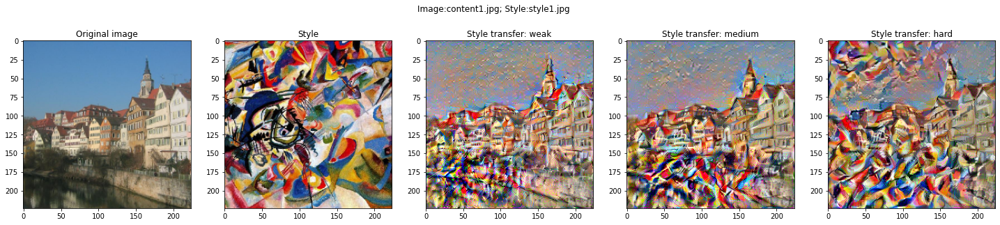

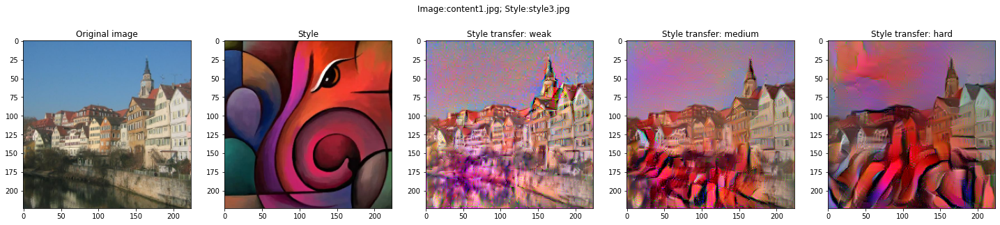

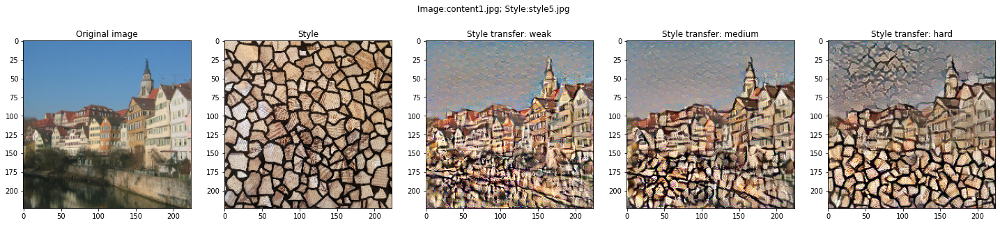

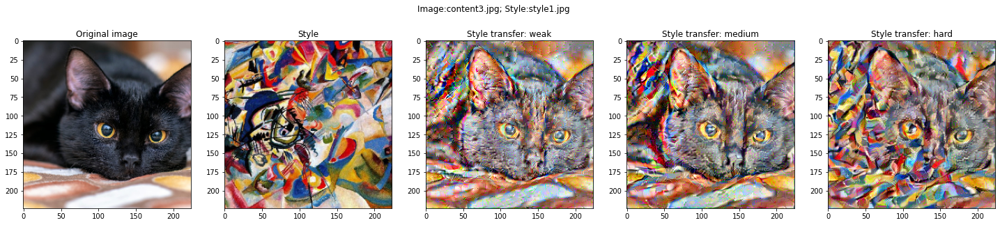

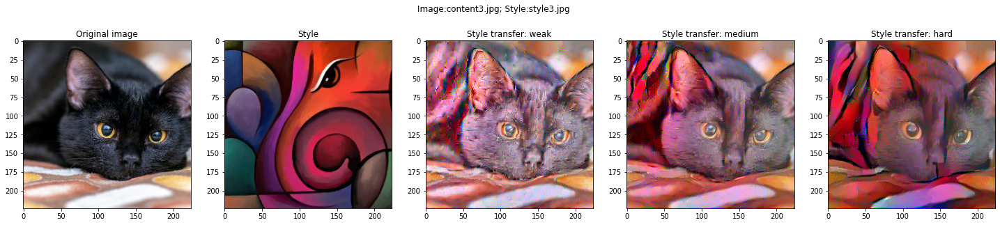

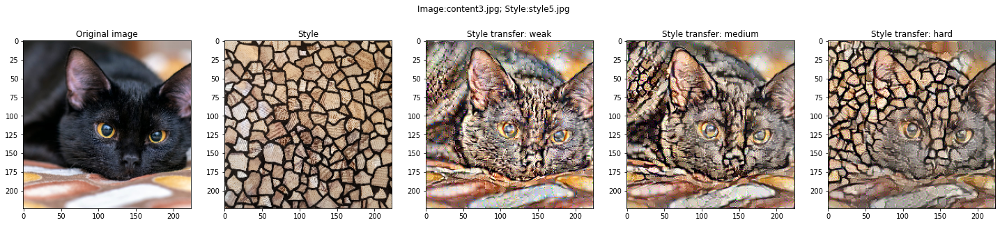

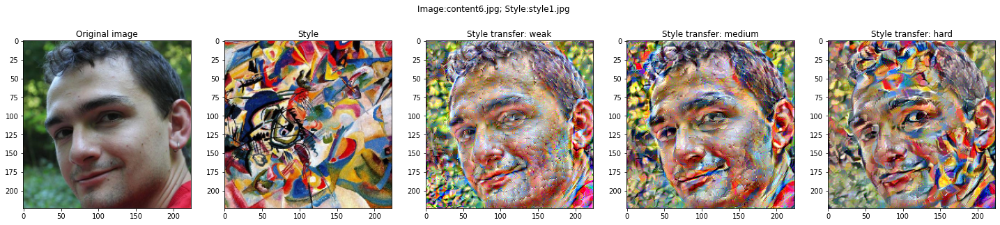

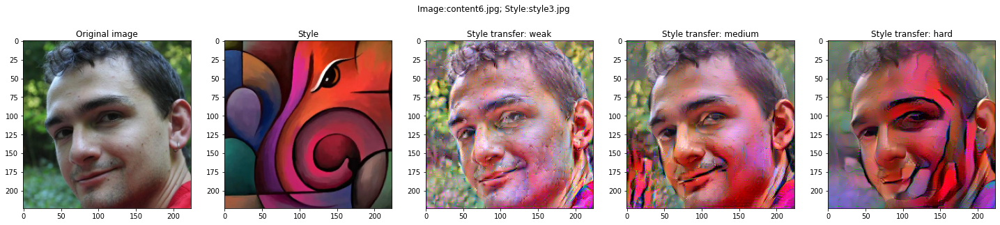

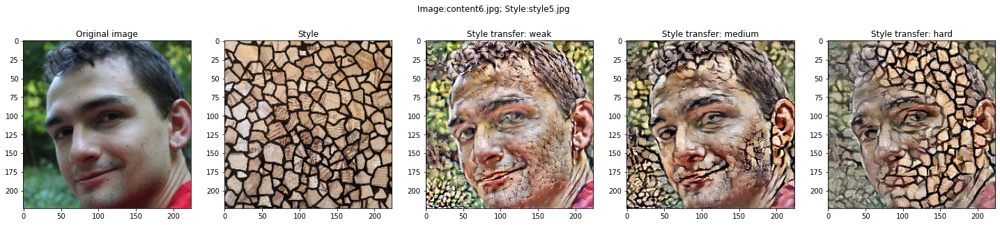

In [18]:
for cfile in tqdm(CONTENT_FILES, desc="Images"):

    for sfile in tqdm(STYLE_FILES, desc=f"Styles for {cfile}", disable=True):
        imgs = []
        for alpha in [0.1, 1, 10]:
            imgs.append(neural_style_transfer(model, sfile, cfile, style_alpha=alpha, epochs=EPOCHS, verbose=False))

        fig, axs = plt.subplots(1, 5, figsize=(25, 5))
        fig.suptitle(f'Image:{cfile}; Style:{sfile}')
        axs[0].imshow(decode_image(load_image(cfile)))
        axs[0].set_title('Original image')
        axs[1].imshow(decode_image(load_image(sfile)))
        axs[1].set_title('Style')
        axs[2].imshow(decode_image(imgs[0]))
        axs[2].set_title('Style transfer: weak')
        axs[3].imshow(decode_image(imgs[1]))
        axs[3].set_title('Style transfer: medium')
        axs[4].imshow(decode_image(imgs[2]))
        axs[4].set_title('Style transfer: hard')